In [2]:
%load_ext autoreload
%autoreload 2

In [1]:

import argparse
import copy
import itertools
import logging
import math
import os, json5 as json
import random
import shutil
import warnings
import functools
from contextlib import nullcontext
from pathlib import Path

from copy import deepcopy
from typing import *

import numpy as np
import torch
from torch import nn
import torch.utils.checkpoint
import transformers
from accelerate import Accelerator, DistributedType
from accelerate.logging import get_logger
from accelerate.utils import DistributedDataParallelKwargs, ProjectConfiguration, set_seed
from huggingface_hub import create_repo, upload_folder
from huggingface_hub.utils import insecure_hashlib
from peft import LoraConfig, set_peft_model_state_dict
from peft.utils import get_peft_model_state_dict
from PIL import Image
from PIL.ImageOps import exif_transpose
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms.functional import crop
from tqdm.auto import tqdm
# from transformers import CLIPTokenizer, PretrainedConfig, T5TokenizerFast

from transformers import (
    Qwen2_5_VLForConditionalGeneration,
    Qwen2Tokenizer,
    Qwen2VLProcessor,
)

import diffusers
from diffusers import (
    AutoencoderKL,
    FlowMatchEulerDiscreteScheduler,
    # QwenImageEditPipeline,
    QwenImageTransformer2DModel,
    AutoencoderKLQwenImage,
)
from diffusers.optimization import get_scheduler
from diffusers.training_utils import (
    _set_state_dict_into_text_encoder,
    cast_training_params,
    compute_density_for_timestep_sampling,
    compute_loss_weighting_for_sd3,
    free_memory,
)
from diffusers.utils import (
    check_min_version,
    convert_unet_state_dict_to_peft,
    is_wandb_available,
)
from diffusers.utils.hub_utils import load_or_create_model_card, populate_model_card
from diffusers.utils.torch_utils import is_compiled_module

from dataclasses import dataclass, field, asdict
from transformers import HfArgumentParser
from transformers.image_utils import ChannelDimension
# from diffusers import QwenImageEditPipeline

if is_wandb_available():
    import wandb

from alpha.args import ModelArguments, CustomTrainingArguments, DataArguments
from alpha.utils import alpha_blend, load_json_file
from alpha.vae.modeling import load_vae_from_local_dir
from alpha.pipelines.qwen_image_edit import CustomQwenImageEditPlusPipeline as QwenImageEditPlusPipeline
from alpha.pipelines.qwen_image_edit import QwenImageEditModules


model_path = "/home/tiger/resources/checkpoints/huggingface/Qwen/Qwen-Image-Edit-2509"

# Raw Model Paths

# model_path = "/home/tiger/resources/checkpoints/huggingface/Qwen/Qwen-Image-Edit"  # Works
vae_path = None
lora_path = None

# V1

# model_path = "/home/tiger/resources/checkpoints/huggingface/Qwen/Qwen-Image-Edit"
# vae_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/vae/2025-10-03_02-56-45-vae_wo_ref_kl/checkpoint-50000/hf"
# lora_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/train/qwen-image-edit-omni-alpha-lora/2025-10-20_20-30-50/checkpoint-22500/pytorch_lora_weights.safetensors"

# V2

# model_path = "/home/tiger/resources/checkpoints/huggingface/Qwen/Qwen-Image-Edit-2509"
# vae_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/vae/2025-10-21_17-37-35-vae_wo_ref_kl/checkpoint-25000/hf"
# lora_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/train/qwen-image-edit-omni-alpha-lora/2025-10-20_20-30-50/checkpoint-22500/pytorch_lora_weights.safetensors"

# V4

vae_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/train/vae/v4/2025-11-01_00-36-48-vae_main/checkpoint-32500/hf"
lora_path = "/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/runs/train/omni-alpha-lora-mix/v4/2025-11-04_23-17-00/checkpoint-30000/pytorch_lora_weights.safetensors"

device = "cuda" 
dtype = torch.bfloat16
final_format = "RGBA" if vae_path else "RGB"

pipeline = QwenImageEditPlusPipeline.from_pretrained(
    model_path,
) if not vae_path else QwenImageEditPlusPipeline.from_pretrained(
    model_path,
    vae=load_vae_from_local_dir(vae_path)
)

if lora_path:
    pipeline.load_lora_weights(lora_path)

pipeline = pipeline.to(device, dtype)
# print(next(pipeline.vae.parameters()).device)  # check VAE is on GPU

/home/tiger/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading pipeline components...: 100%|██████████| 6/6 [00:12<00:00,  2.09s/it]


In [4]:
print(pipeline.prompt_template_encode)
assert "<|image_pad|>" not in pipeline.prompt_template_encode

<|im_start|>system
Describe the key features of the input image (color, shape, size, texture, objects, background), then explain how the user's text instruction should alter or modify the image. Generate a new image that meets the user's requirements while maintaining consistency with the original input where appropriate.<|im_end|>
<|im_start|>user
{}<|im_end|>
<|im_start|>assistant



100%|██████████| 10/10 [00:06<00:00,  1.49it/s]


[<PIL.Image.Image image mode=RGBA size=1024x512 at 0x7F12B82DBBB0>]


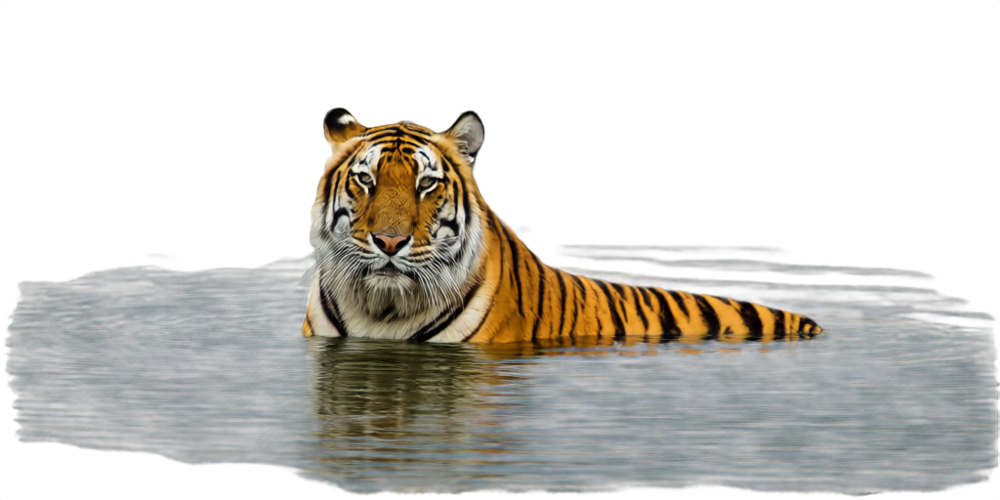

In [9]:
# Directly Use + T2I

with torch.no_grad():
    # prompt = "A cool girl with sunglasses wearing JK uniform and playing guitar in cyberpunk style."
    prompt = "A cool tiger on the river, transparent background"
    # image1 = Image.open("./liuying.webp")
    # image2 = Image.open("./cyberpunk.jpg")
    
    outputs = pipeline(
        negative_prompt="",
        prompt=prompt,
        # image=[image1, image2],
        num_inference_steps=10,
        height=512,
        width=1024,
        true_cfg_scale=4,
        # debug=True,
        generator=torch.Generator(device).manual_seed(42),
    ).images
    
print(outputs)
outputs[0]

DEBUG 3
prompt=None
condition_images=[]
prompt_embeds.shape=torch.Size([1, 22, 3584]), prompt_embeds_mask.shape=torch.Size([1, 22])
prompt_embeds.min()=tensor(-139., device='cuda:0', dtype=torch.bfloat16), prompt_embeds.max()=tensor(110., device='cuda:0', dtype=torch.bfloat16)
prompt_embeds.std()=tensor(5.2500, device='cuda:0', dtype=torch.bfloat16), prompt_embeds.mean()=tensor(-0.1221, device='cuda:0', dtype=torch.bfloat16)


 30%|███       | 3/10 [00:00<00:02,  3.14it/s]

100%|██████████| 10/10 [00:03<00:00,  3.12it/s]

[<PIL.Image.Image image mode=RGB size=512x512 at 0x7F893FA12FE0>]


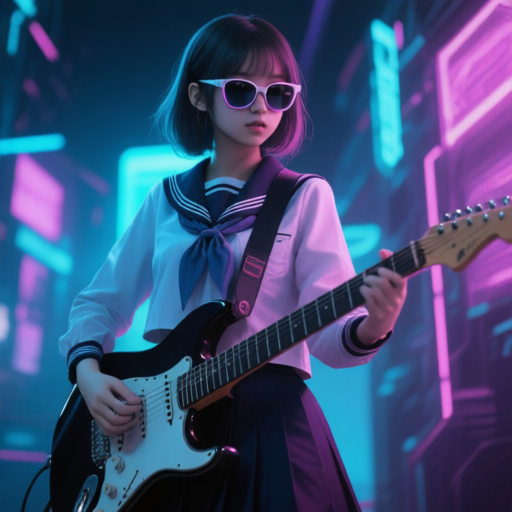

In [56]:
# Step-Wise Use + T2I

with torch.no_grad():
    prompt = "Generate a cool girl with sunglasses wearing JK uniform and playing guitar in cyberpunk style."
    
    prompt_embeds, prompt_embeds_mask = pipeline.encode_prompt(
        image=None,
        prompt=prompt,
        device=device,
    )
    
    outputs = pipeline(
        negative_prompt="",
        # prompt=prompt,
        # image=[image1, image2],
        prompt_embeds=prompt_embeds,
        prompt_embeds_mask=prompt_embeds_mask,
        num_inference_steps=10,
        height=512,
        width=512,
        true_cfg_scale=4,
        debug=True,
        generator=torch.Generator(device).manual_seed(42),
    ).images
    
print(outputs)
outputs[0]

DEBUG 3
vae_images[0].shape=torch.Size([1, 3, 1, 1376, 768]), vae_image_sizes=[(1376, 768), (1184, 896)]
prompt='Based on the given character (keep all the features) in the 1st picture, generate a cool girl with sunglasses wearing JK uniform and playing guitar in the style of the 2nd picture.'
condition_images=[<PIL.Image.Image image mode=RGB size=288x512 at 0x7F893F9EADA0>, <PIL.Image.Image image mode=RGB size=320x448 at 0x7F893F9E9D20>]
prompt_embeds.shape=torch.Size([1, 415, 3584]), prompt_embeds_mask.shape=torch.Size([1, 415])
prompt_embeds.min()=tensor(-217., device='cuda:0', dtype=torch.bfloat16), prompt_embeds.max()=tensor(126., device='cuda:0', dtype=torch.bfloat16)
prompt_embeds.std()=tensor(4.6250, device='cuda:0', dtype=torch.bfloat16), prompt_embeds.mean()=tensor(-0.1504, device='cuda:0', dtype=torch.bfloat16)


100%|██████████| 5/5 [00:59<00:00, 12.00s/it]


latents.shape=torch.Size([1, 12288, 64]), frames=3, latent_height=128, latent_width=128
[<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F893F9E94B0>, <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F893F9E94E0>, <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F893F9EAC80>]


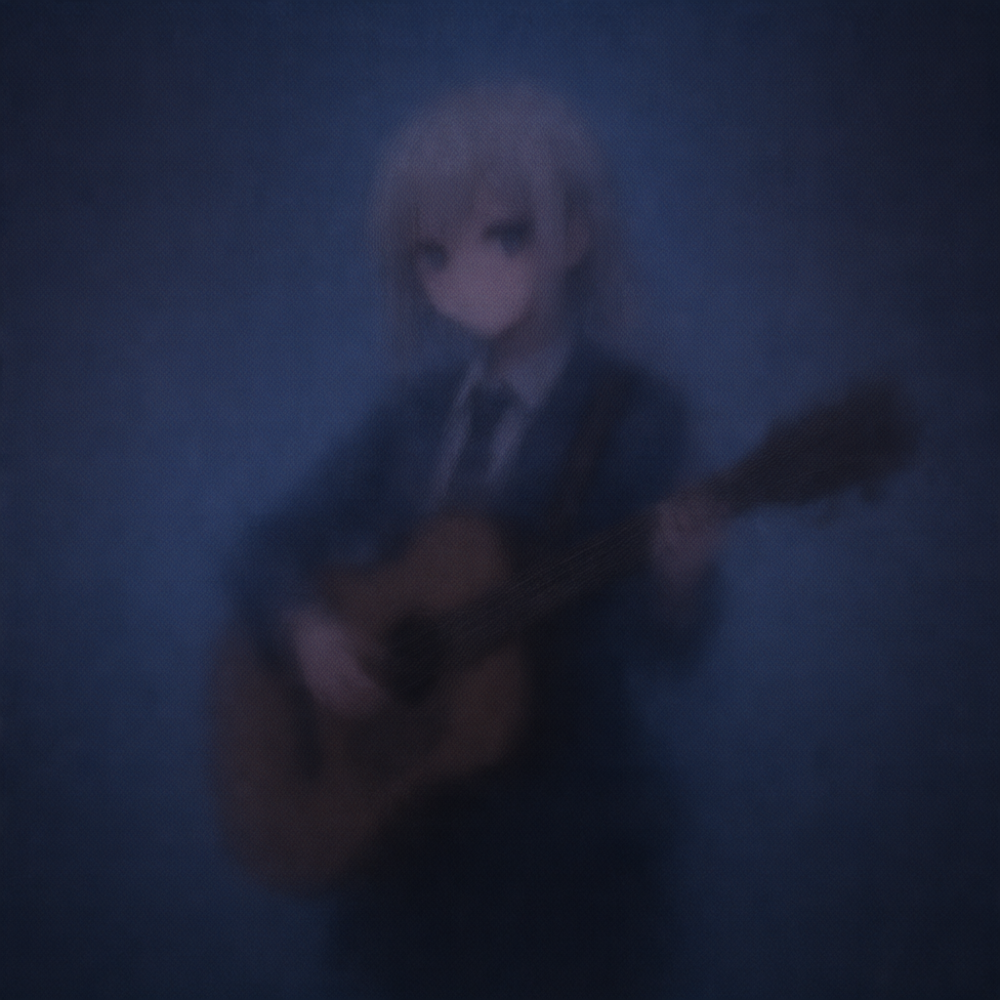

In [74]:
# Directly Use + TI2I

with torch.no_grad():
    prompt = "Based on the given character (keep all the features) in the 1st picture, generate a cool girl with sunglasses wearing JK uniform and playing guitar in the style of the 2nd picture."
    image1 = Image.open("./liuying.webp")
    image2 = Image.open("./cyberpunk.jpg")
    
    outputs = pipeline(
        negative_prompt="",
        prompt=prompt,
        image=[image1, image2],
        num_inference_steps=5,
        height=1024,
        width=1024,
        true_cfg_scale=4,
        debug=True,
        generator=torch.Generator(device).manual_seed(42),
        frames=3,
    ).images
    
print(outputs)
outputs[0]

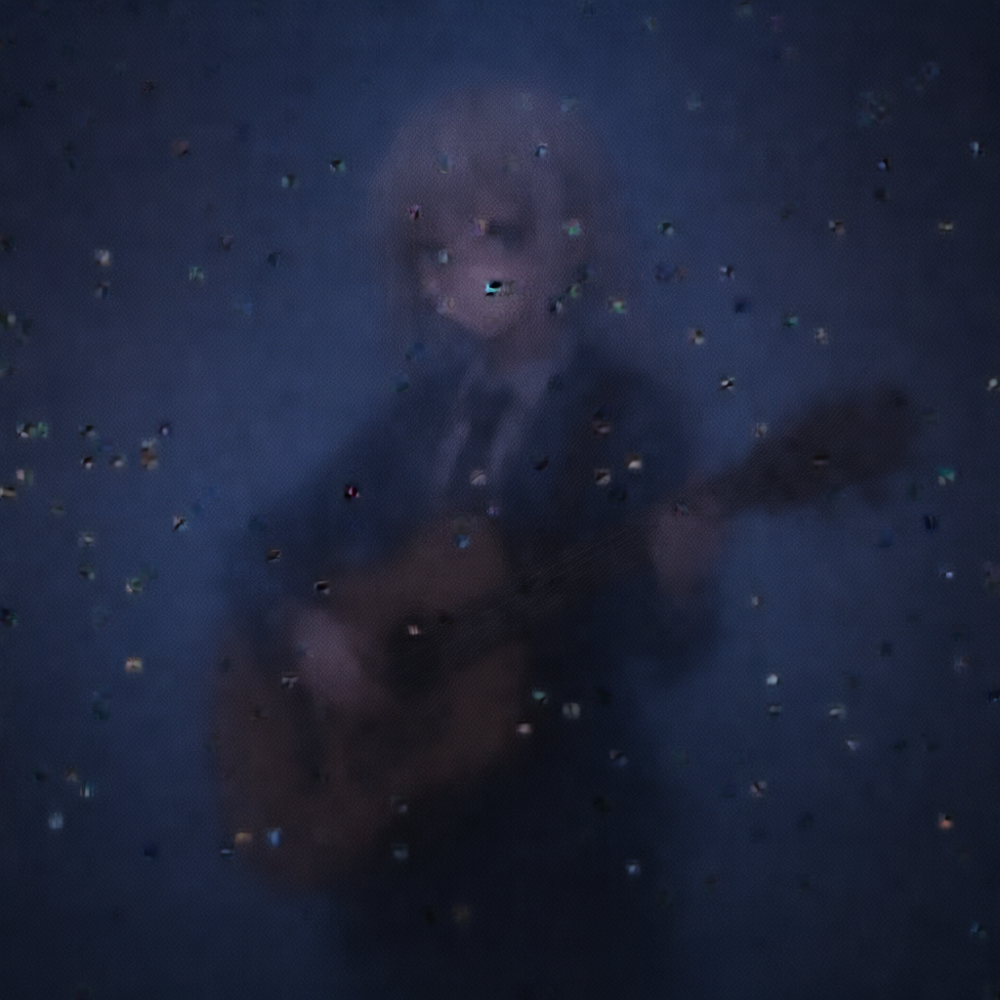

In [76]:
outputs[2]

prompt_embeds.shape=torch.Size([1, 3317, 3584]), prompt_embeds_mask.shape=torch.Size([1, 3317])
prompt_embeds.min()=tensor(-233., device='cuda:0', dtype=torch.bfloat16), prompt_embeds.max()=tensor(176., device='cuda:0', dtype=torch.bfloat16)
prompt_embeds.std()=tensor(4.3125, device='cuda:0', dtype=torch.bfloat16), prompt_embeds.mean()=tensor(-0.1387, device='cuda:0', dtype=torch.bfloat16)
DEBUG 3
vae_images[0].shape=torch.Size([1, 3, 1, 1920, 1088]), vae_image_sizes=[(1920, 1088), (768, 576)]
prompt=None
condition_images=[<PIL.Image.Image image mode=RGB size=1088x1920 at 0x7F893F817D90>, <PIL.Image.Image image mode=RGB size=576x768 at 0x7F893F816470>]
prompt_embeds.shape=torch.Size([1, 3317, 3584]), prompt_embeds_mask.shape=torch.Size([1, 3317])
prompt_embeds.min()=tensor(-233., device='cuda:0', dtype=torch.bfloat16), prompt_embeds.max()=tensor(176., device='cuda:0', dtype=torch.bfloat16)
prompt_embeds.std()=tensor(4.3125, device='cuda:0', dtype=torch.bfloat16), prompt_embeds.mean()=t

100%|██████████| 10/10 [01:29<00:00,  8.96s/it]


latents.shape=torch.Size([1, 4096, 64]), frames=1, latent_height=128, latent_width=128
[<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F893F816E60>]


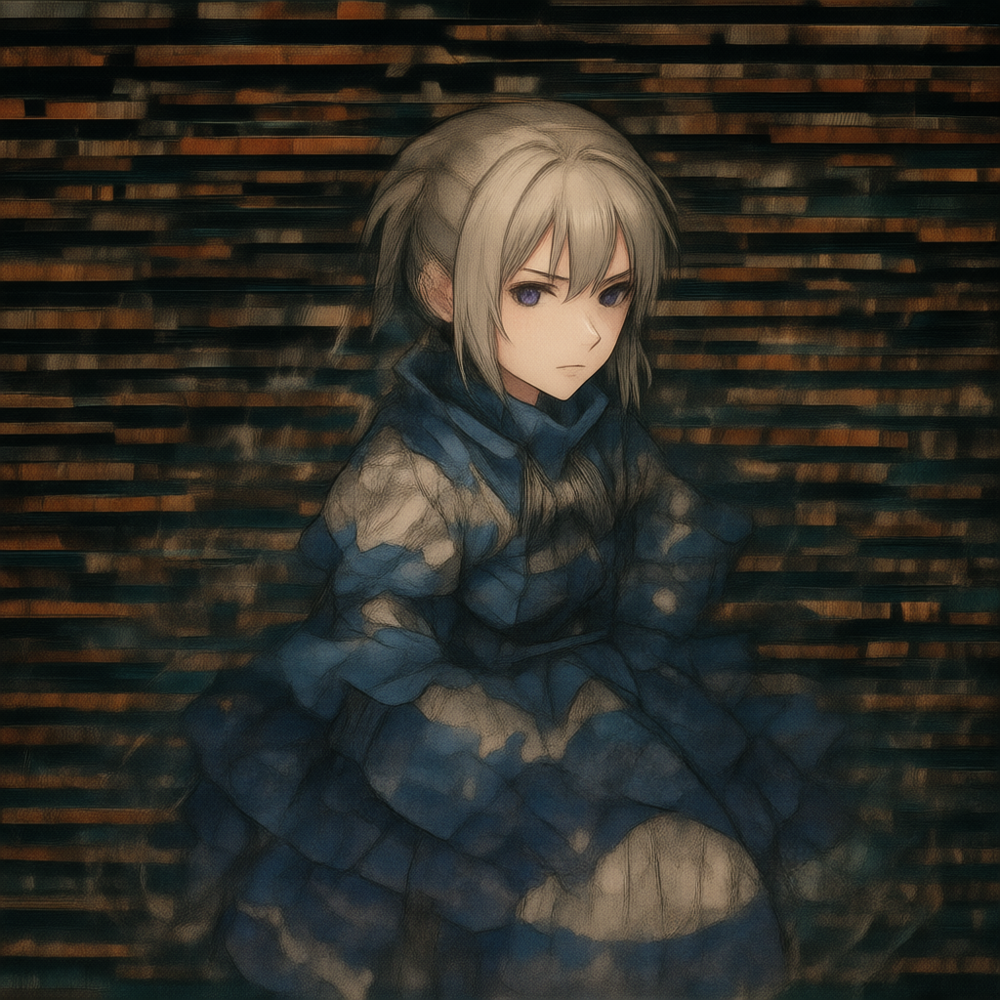

In [80]:
# Step-wise Use + TI2I

with torch.no_grad():
    prompt = "Based on the given character (keep all the features) in the 1st picture, generate a cool girl with sunglasses wearing JK uniform and playing guitar in the style of the 2nd picture."
    image1 = Image.open("./liuying.webp")
    image2 = Image.open("./cyberpunk.jpg")

    condition_images, condition_image_sizes = pipeline.prepare_images(
        images=[image1, image2],
        prepare_type='condition',
        reshape=False
    )
    prompt_embeds, prompt_embeds_mask = pipeline.encode_prompt(
        image=condition_images,
        prompt=prompt,
        device=device,
    )
    
    print(f"{prompt_embeds.shape=}, {prompt_embeds_mask.shape=}")
    print(f"{prompt_embeds.min()=}, {prompt_embeds.max()=}")
    print(f"{prompt_embeds.std()=}, {prompt_embeds.mean()=}")

    outputs = pipeline(
        negative_prompt="",
        # prompt=prompt,
        image=[image1, image2],
        prompt_embeds=prompt_embeds,
        prompt_embeds_mask=prompt_embeds_mask,
        num_inference_steps=10,
        height=1024,
        width=1024,
        true_cfg_scale=4,
        debug=True,
        generator=torch.Generator(device).manual_seed(42),
        reshape=False,
    ).images
    
print(outputs)
outputs[0]

# Deprecated

In [ ]:


from alpha.pipelines.qwen_image_edit import calculate_dimensions
from alpha.utils import alpha_blend
import torch.functional as F

with torch.no_grad():
    # prompt = "A beautiful anime girl."
    # prompt = "A beautiful anime girl. 韩漫风格"
    prompt = "Based on the given character, generate a cool girl with sunglasses wearing JK uniform and playing guitar."
    # prompt = "Based on the given style, generate a cool real girl with sunglasses wearing JK uniform and playing guitar."
    image_path = "./liuying.webp"
    with open(image_path, "rb") as f:
        image = Image.open(f).convert("RGBA")
    
    # prompt_image = image
    
    # TODO: 调通 image 作为 input
    
    image_size = image[0].size if isinstance(image, list) else image.size
    calculated_width, calculated_height, _ = calculate_dimensions(512 * 512, image_size[0] / image_size[1])
    prompt_image = pipeline.image_processor.resize(image, calculated_height, calculated_width).convert("RGB")
    
    # prompt_image_tensor = transforms.Normalize([0.5], [0.5])(transforms.ToTensor()(prompt_image)).unsqueeze(0).to(device, dtype) # BCHW
    # prompt_image_tensor = F.pil_to_tensor(prompt_image).unsqueeze(0).to(device, dtype) # BCHW
    # prompt_image_tensor = transforms.ToTensor()(prompt_image).unsqueeze(0).to(device, dtype) # BCHW
    # preprocessed_image_tensor = pipeline.processor.image_processor.preprocess(prompt_image).pixel_values
    
    # print(f"{preprocessed_image_tensor.shape=}")
    
    # NOTE: DO NOT NORMALIZE INPUT IMAGE WHEN FEEDING INTO THE ENCODER
    
    # blended_input_images_tensor = alpha_blend(prompt_image_tensor, 1., alpha_min=0)
    # blended_input_images_tensor = prompt_image_tensor
    
    prompt_embeds, prompt_embeds_mask = pipeline.encode_prompt(
        # image=[prompt_image, prompt_image],
        image=[prompt_image, pipeline.image_processor.resize(prompt_image, 384, 384)],
        # image=preprocessed_image_tensor,
        prompt=prompt,
        # prompt_embeds=prompt_embeds,
        # prompt_embeds_mask=prompt_embeds_mask,
        device=device,
        # num_images_per_prompt=num_images_per_prompt,
        # max_sequence_length=max_sequence_length,
    )
    
    print(f"{prompt_embeds.shape=}, {prompt_embeds_mask.shape=}")
    
    latents = torch.randn(
        (1, int((1024 // pipeline.vae_scale_factor / 2)**2), pipeline.transformer.in_channels),
        device=device,
        dtype=dtype,
    )
    
    image = pipeline(
        negative_prompt="",
        # prompt=prompt,
        image=image.convert(final_format),
        prompt_embeds=prompt_embeds,
        prompt_embeds_mask=prompt_embeds_mask,
        num_inference_steps=5,
        height=1024,
        width=1024,
        true_cfg_scale=4,
        latents=latents,
        # debug=True,
    ).images
    
    # image = pipeline(
    #     negative_prompt="",
    #     prompt=prompt,
    #     # image=prompt_image,
    #     image=image.convert("RGB"),
    #     num_inference_steps=10,
    #     height=512,
    #     width=512,
    #     true_cfg_scale=4,
    # ).images
print(image[0].size)
image[0]

ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
from alpha.pipelines.qwen_image_edit import calculate_dimensions
from alpha.utils import alpha_blend
import torch.functional as F

with torch.no_grad():
    # prompt = "A beautiful anime girl."
    # prompt = "A beautiful anime girl. 韩漫风格"
    prompt = "Based on the given character, generate a cool girl with sunglasses wearing JK uniform and playing guitar."
    # prompt = "Based on the given style, generate a cool real girl with sunglasses wearing JK uniform and playing guitar."
    image_path = "./liuying.webp"
    with open(image_path, "rb") as f:
        image = Image.open(f).convert("RGBA")
        image_tensor = transforms.Normalize([0.5], [0.5])(transforms.ToTensor()(image)).unsqueeze(0).to(device, dtype) # BCHW
    
    # prompt_image = image
    
    # TODO: 调通 image 作为 input
    
    image_size = image[0].size if isinstance(image, list) else image.size
    calculated_width, calculated_height, _ = calculate_dimensions(1024 * 1024, image_size[0] / image_size[1])
    prompt_image = pipeline.image_processor.resize(image, calculated_height, calculated_width)
    
    # prompt_image_tensor = transforms.Normalize([0.5], [0.5])(transforms.ToTensor()(prompt_image)).unsqueeze(0).to(device, dtype) # BCHW
    # prompt_image_tensor = F.pil_to_tensor(prompt_image).unsqueeze(0).to(device, dtype) # BCHW
    prompt_image_tensor = transforms.ToTensor()(prompt_image).unsqueeze(0).to(device, dtype) # BCHW
    
    # NOTE: DO NOT NORMALIZE INPUT IMAGE WHEN FEEDING INTO THE ENCODER
    
    blended_input_images_tensor = alpha_blend(prompt_image_tensor, 1., alpha_min=-1)
    
    
    prompt_embeds, prompt_embeds_mask = pipeline.encode_prompt(
        # image=prompt_image.convert("RGB"),
        image=blended_input_images_tensor,
        prompt=prompt,
        # prompt_embeds=prompt_embeds,
        # prompt_embeds_mask=prompt_embeds_mask,
        device=device,
        # num_images_per_prompt=num_images_per_prompt,
        # max_sequence_length=max_sequence_length,
    )
    
    print(f"{prompt_embeds.shape=}, {prompt_embeds_mask.shape=}")
    
    latents = torch.randn(
        (1, pipeline.transformer.in_channels, 512 // 8, 512 // 8),
        device=device,
        dtype=dtype,
    )
    
    image = pipeline(
        latents=latents,
        negative_prompt="",
        # prompt=prompt,
        image=image.convert(final_format),
        prompt_embeds=prompt_embeds,
        prompt_embeds_mask=prompt_embeds_mask,
        num_inference_steps=20,
        height=512,
        width=512,
        true_cfg_scale=4,
        # debug=True,
    ).images

print(image[0].shape)
image[0]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:18<00:00,  2.69it/s]


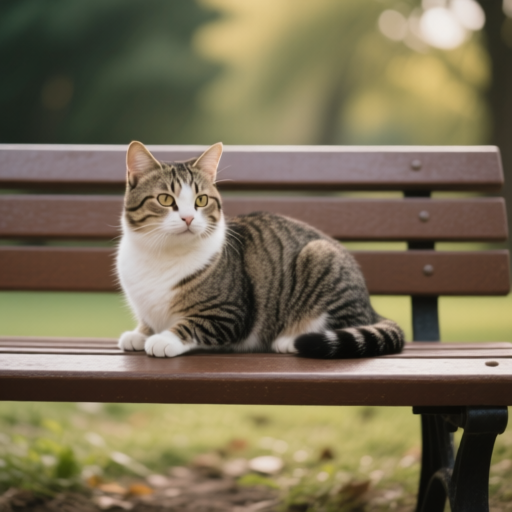

In [4]:
with torch.no_grad():
    prompt = "A cat sitting on a bench"
    
    prompt_embeds, prompt_embeds_mask = pipeline.encode_prompt(
        prompt,
    )
    
    image = pipeline(
        negative_prompt="",
        true_cfg_scale=4.0,
        prompt_embeds=prompt_embeds,
        prompt_embeds_mask=prompt_embeds_mask,
        num_inference_steps=30,
        height=512,
        width=512,
    ).images[0]

image

In [78]:
import torch
import torch.nn as nn

class QwenEmbedRope(nn.Module):
    def __init__(self, theta: int, axes_dim: List[int], scale_rope=False):
        super().__init__()
        self.theta = theta
        self.axes_dim = axes_dim
        pos_index = torch.arange(4096)
        neg_index = torch.arange(4096).flip(0) * -1 - 1
        self.pos_freqs = torch.cat(
            [
                self.rope_params(pos_index, self.axes_dim[0], self.theta),
                self.rope_params(pos_index, self.axes_dim[1], self.theta),
                self.rope_params(pos_index, self.axes_dim[2], self.theta),
            ],
            dim=1,
        )
        self.neg_freqs = torch.cat(
            [
                self.rope_params(neg_index, self.axes_dim[0], self.theta),
                self.rope_params(neg_index, self.axes_dim[1], self.theta),
                self.rope_params(neg_index, self.axes_dim[2], self.theta),
            ],
            dim=1,
        )

        # DO NOT USING REGISTER BUFFER HERE, IT WILL CAUSE COMPLEX NUMBERS LOSE ITS IMAGINARY PART
        self.scale_rope = scale_rope

    def rope_params(self, index, dim, theta=10000):
        """
        Args:
            index: [0, 1, 2, 3] 1D Tensor representing the position index of the token
        """
        assert dim % 2 == 0
        freqs = torch.outer(index, 1.0 / torch.pow(theta, torch.arange(0, dim, 2).to(torch.float32).div(dim)))
        freqs = torch.polar(torch.ones_like(freqs), freqs)
        return freqs

rope = QwenEmbedRope(theta=10000, axes_dim=[64, 64, 64], scale_rope=False)
print(rope.pos_freqs.shape)

torch.Size([4096, 96])


原始图像模式: RGBA


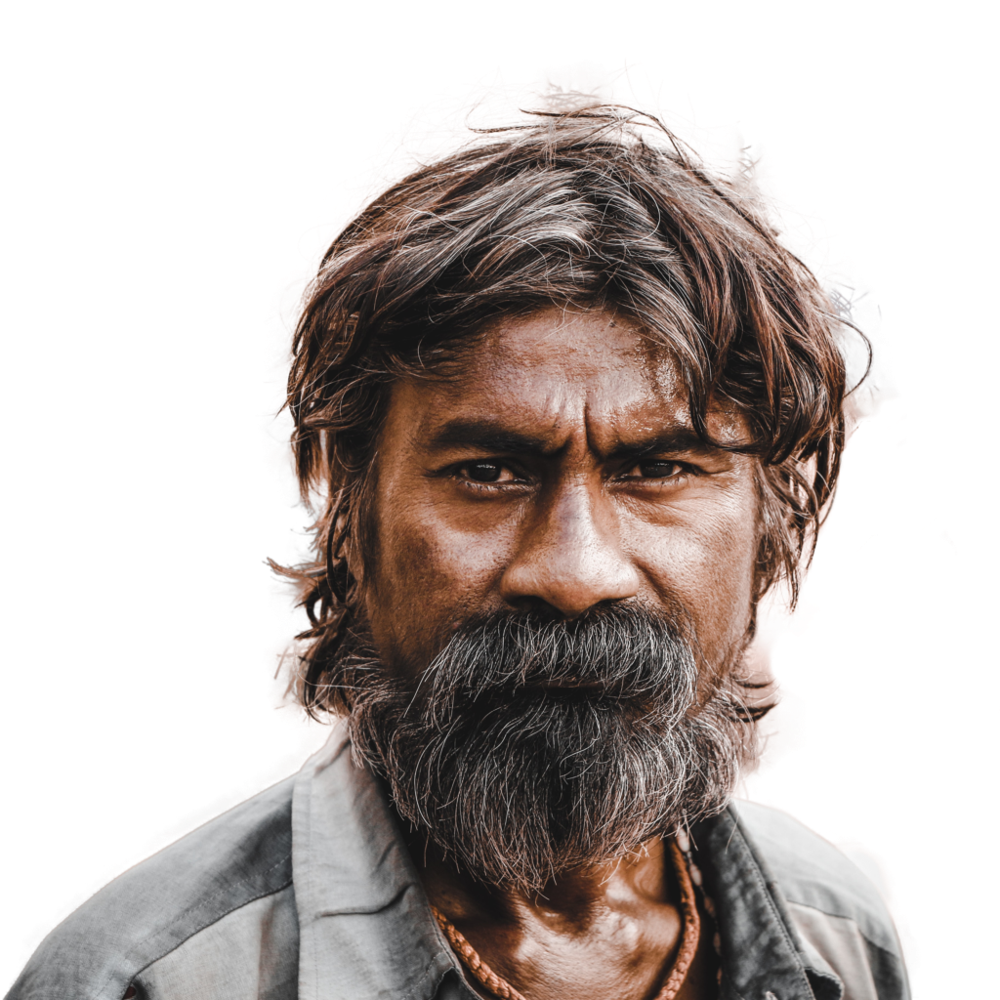

In [ ]:
from PIL import Image

rgba_image = Image.open("/mnt/bn/agent-workspace/workspace/projects/video/RGBA-VAE/AlphaDecompose/Dataset/AlphaVAE_triple_gen/AlphaVAE_dataset/00003.png")
print(f"原始图像模式: {rgba_image.mode}")
rgba_image

混合后图像模式: RGB


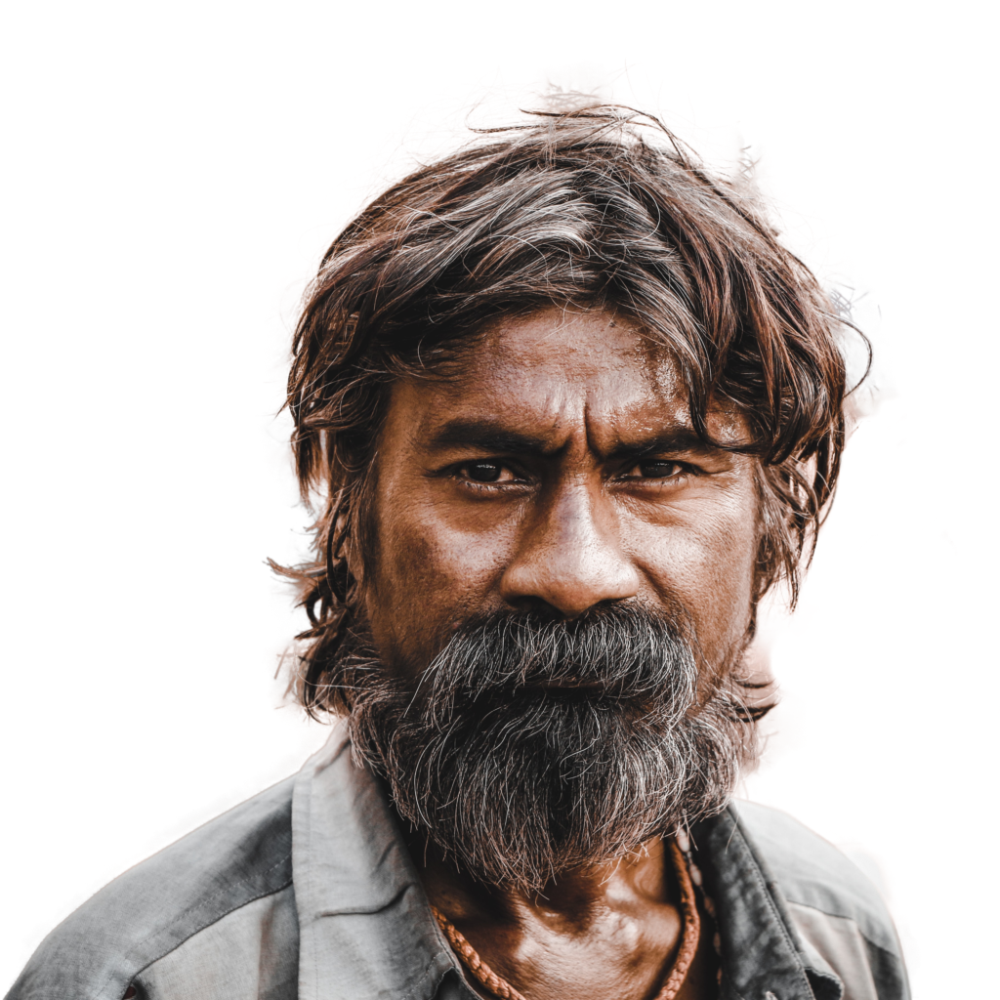

In [ ]:
background = Image.new("RGB", rgba_image.size, (255, 255, 255))
background.paste(rgba_image, (0, 0), rgba_image)
rgb_image = background
print(f"混合后图像模式: {rgb_image.mode}")
rgb_image

In [14]:
from alpha.pipelines.qwen_image_edit import CustomQwenImageEditPlusPipeline as P
import torch


x = torch.randn(1, 4, 1, 32, 64)
z = P.pack_latents_multi_frames(x)
pred_x = P.unpack_latents_multi_frames(z, 1, 32, 64)

print(f"{x.shape=}, {z.shape=}, {pred_x.shape=}")

diff = pred_x - x

print(torch.max(diff), torch.min(diff))

x.shape=torch.Size([1, 4, 1, 32, 64]), z.shape=torch.Size([1, 512, 16]), pred_x.shape=torch.Size([1, 4, 1, 32, 64])
tensor(0.) tensor(0.)
